# Packages import and global variables

In [1]:
import csv
import pandas as pd
import glob
import matplotlib.pyplot as plt
import os
import numpy as np
import seaborn as sns; sns.set_theme()
import math
from io import StringIO
from IPython.display import display, HTML

C:\Users\USER\miniconda3\envs\chem\lib\site-packages\scipy\__init__.py:177: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


**You must specify the number of frames per nanosecond in your trajectory**

In [2]:
frames_per_ns = 20
work_dir = r"C:\Users\USER\OneDrive\Documents\work\Projects\Abl1 kinase Karpenko autoencoder model 1\abl_native"
save_dir = r"C:\Users\USER\OneDrive\Documents\work\Projects\Abl1 kinase Karpenko autoencoder model 1\abl_native\MD report test"
RU = False

## Restore the original numbering to the amino acid residues

This helper code is only needed for **decomposition**, **RMSF** and **hydrogen bonds** <br />

If you have **one chain**, then you must indicate the **shift**, which will be added to the indices of amino acid residues <br />

If you have **more than one chain**, then you must indicate **the name for each chain**, **the indices** of the amino acid residues from which the chains begin, **the shifts** and **which chains to display** in the decomposition

In [3]:
chain_names = ["A"]
chains_begin_index = [1]
index_shift = [227]
chains_to_show = ["A"]

#####

pdb_dict = {"HIP" : "HIS", "HIE" : "HIS", "HID" : "HIS", "CYX" : "CYS", "CYM" : "CYS"}

def get_chain(resi_num):
    chains_num = len(chains_begin_index)
    
    for i in range(chains_num):
        if resi_num >= chains_begin_index[i] and (i + 1 == chains_num or resi_num < chains_begin_index[i+1]):
            return i + 1

def get_resi_num(resi_index):
    resi_chain = get_chain(resi_index)
    
    return resi_index + index_shift[resi_chain-1]

    
def rename_residue(name, chain=True):
    resi_name = name[:3]
    resi_index = int(name[3:].replace("_", " "))
    
    resi_chain = get_chain(resi_index)
    
    if resi_name in pdb_dict:
        resi_name = pdb_dict[resi_name]
        
    new_name = resi_name + "\t".expandtabs(1) + str(resi_index + index_shift[resi_chain-1])
    
    if chain:
        new_name = chain_names[resi_chain-1] + ": " + new_name
    
    return new_name

# Energy analysis

##### Helper Functions

In [4]:
def get_energy_delta_csv(dat_file, mode="gb"):
    energy_lines = open(dat_file, 'r').readlines()
    
    if mode == "gb":
        line = "GENERALIZED BORN:\n"
    elif mode == "pb":
        line = "POISSON BOLTZMANN:\n"
    elif mode == "entropy":
        line = "NMODE entropy results\n"
    
    try:
        cm_index = energy_lines.index(line)
    except:
        print(os.path.basename(dat_file), ": " + line[:-1] + " NOT FOUND")
        return
    
    try:
        delta_index = energy_lines[cm_index:].index('DELTA Energy Terms\n')
    except:
        print(os.path.basename(dat_file), ": DELTA Energy Terms NOT FOUND")
        return
    
    delta_end_index = delta_index + energy_lines[delta_index:].index('\n')
    delta_string = ''.join(energy_lines[delta_index+1:delta_end_index])

    return StringIO(delta_string)

def mean_window(energy, window_size=11):
    size = energy.shape[0]
    res = np.zeros(shape=size)
    for i in range(0, size):
        bottom = max(i - window_size // 2, 0)
        upper = min(size, i + window_size - window_size // 2)
        res[i] = np.nanmean(energy[bottom:upper])
    return res

## Enthalpy

In [5]:
enthalpy_dir = work_dir + os.sep + 'enthalpy'
enthalpy_start, enthalpy_end, enthalpy_step = 2, 4000, 2

energy_mean_threshold = 51 #ns

#####

enthalpy_time = np.arange(enthalpy_start, enthalpy_end+1, enthalpy_step) / frames_per_ns
enthalpy_threshold_frame = (energy_mean_threshold * frames_per_ns - enthalpy_start) // enthalpy_step

pd_enthalpy_dict = {'Name' : [], 'Enthalpy' : []}

for enthalpy_file in glob.glob(enthalpy_dir + os.sep + '*.dat'):
    pd_enthalpy_dict['Name'].append(os.path.basename(enthalpy_file[:-4]))
    pd_enthalpy_dict['Enthalpy'].append(pd.read_csv(get_energy_delta_csv(enthalpy_file, mode="gb"))['DELTA TOTAL'].values)
    
df_energy = pd.DataFrame(pd_enthalpy_dict)
df_energy['Enthalpy_mean_std'] = df_energy['Enthalpy'].apply(lambda x: (x[enthalpy_threshold_frame:].mean(), x[enthalpy_threshold_frame:].std(ddof=1)))
print(f"Enthalpy data quantity: {df_energy.shape[0]}")
df_energy.head()

Enthalpy data quantity: 22


,Name,Enthalpy,Enthalpy_mean_std
0,1,"[-47.63795959999811, -46.57434751999779, -47.9...","(-40.92548636855809, 4.34523015488755)"
1,10,"[-42.67479464000184, -44.69075951999872, -46.6...","(-42.86654696279011, 4.7205398885997845)"
2,11,"[-41.36778992000069, -44.1846122399968, -44.53...","(-41.69141009824279, 3.3267402797773156)"
3,12,"[-43.76172152000328, -45.61094535999729, -35.9...","(-43.89452234403753, 4.237779649096058)"
4,13,"[-43.18234864000023, -44.66368944000012, -40.9...","(-45.31678544375585, 3.8700681758002395)"


## Entropy (if exists). Automatically calculates full energy

In [6]:
entropy_dir = work_dir + os.sep + 'entropy'
entropy_start, entropy_end, entropy_step = 10, 2000, 10

#####

pd_entropy_dict = {'Name' : [], 'Entropy' : []}

entropy_time = enthalpy_time[entropy_start-1:entropy_end:entropy_step]
energy_threshold_frame = (enthalpy_threshold_frame + 1 - entropy_start) // entropy_step

for entropy_file in glob.glob(entropy_dir + os.sep + '*.dat'):
    pd_entropy_dict['Name'].append(os.path.basename(entropy_file[:-4]))
    pd_entropy_dict['Entropy'].append(pd.read_csv(get_energy_delta_csv(entropy_file, mode="entropy"))['Total'].values)
    
df_entropy = pd.DataFrame(pd_entropy_dict)
df_entropy['Entropy_mean_std'] = df_entropy['Entropy'].apply(lambda x: (np.nanmean(x[energy_threshold_frame:]), np.nanstd(x[energy_threshold_frame:], ddof=1)))
print(f"Entropy data quantity: {df_entropy.shape[0]}")
df_entropy.head()

df_energy = pd.merge(df_energy, df_entropy, on='Name')
df_energy['Energy'] = df_energy['Enthalpy'].apply(lambda x: x[entropy_start-1:entropy_end:entropy_step]) - df_energy['Entropy']
df_energy['Energy_mean_std'] = df_energy['Energy'].apply(lambda x: (np.nanmean(x[energy_threshold_frame:]), np.nanstd(x[energy_threshold_frame:], ddof=1)))
print(f"Energy data quantity: {df_entropy.shape[0]}")
df_energy.head()

Entropy data quantity: 22
Energy data quantity: 22


,Name,Enthalpy,Enthalpy_mean_std,Entropy,Entropy_mean_std,Energy,Energy_mean_std
0,1,"[-47.63795959999811, -46.57434751999779, -47.9...","(-40.92548636855809, 4.34523015488755)","[-26.984960199999776, -33.10717229999959, -21....","(-26.613447410999953, 5.49070919720132)","[-25.940093799999133, -18.696930339996996, -24...","(-14.033163822066745, 5.940010092524451)"
1,10,"[-42.67479464000184, -44.69075951999872, -46.6...","(-42.86654696279011, 4.7205398885997845)","[-30.461091050000093, -29.98375289999961, -24....","(-24.16293069666665, 5.737688604424756)","[-12.665815749999318, -12.098929660002288, -14...","(-18.832033480933337, 7.453875436559899)"
2,11,"[-41.36778992000069, -44.1846122399968, -44.53...","(-41.69141009824279, 3.3267402797773156)","[-28.1948529, -28.4214469, -24.4715557, -25.24...","(-27.044355655333334, 5.154118184415687)","[-7.520790939999017, -10.060375739995642, -16....","(-14.74290434573361, 6.17413975095611)"
3,12,"[-43.76172152000328, -45.61094535999729, -35.9...","(-43.89452234403753, 4.237779649096058)","[-19.81236565000087, -30.433363099999568, -25....","(-28.44952467933336, 5.041954417604298)","[-20.14662954999652, -12.327760819998545, -19....","(-15.309890163866731, 7.151323081818959)"
4,13,"[-43.18234864000023, -44.66368944000012, -40.9...","(-45.31678544375585, 3.8700681758002395)","[-26.402076949999376, -26.210664650000112, -33...","(-23.40047368933325, 5.384837383948364)","[-16.743929129998996, -17.062956310000402, -18...","(-22.264827997066433, 6.25530708766078)"


## Set order for data
You can choose two options: 
1. Sorting by energy with the ability to write to a file
2. Read the required order of data from a file

### Sort data

In [7]:
sort_by = "Energy"

#####

df_energy = df_energy.sort_values(sort_by + "_mean_std")
df_energy.reset_index(drop=True, inplace=True)

#### Write file

In [8]:
file_csv = save_dir + os.sep + "energy_top_order.csv"

#####

df_energy[["Name", "Name"]].to_csv(file_csv, header=["Name", "New name"], index=False)

### Read file

In [ ]:
file_csv= save_dir + os.sep + "energy_top_order.csv"

#####

df_order = pd.read_csv(file_csv, dtype={'Name' : str, 'New name' : str})
df_energy = pd.merge(df_order, df_energy, on='Name', how='left').drop(columns="Name").rename(columns={"New name" : "Name"})

## Draw plots
Enter the appropriate number of rows and columns for your data

Max energy: 20.3	 Min energy: -55.0


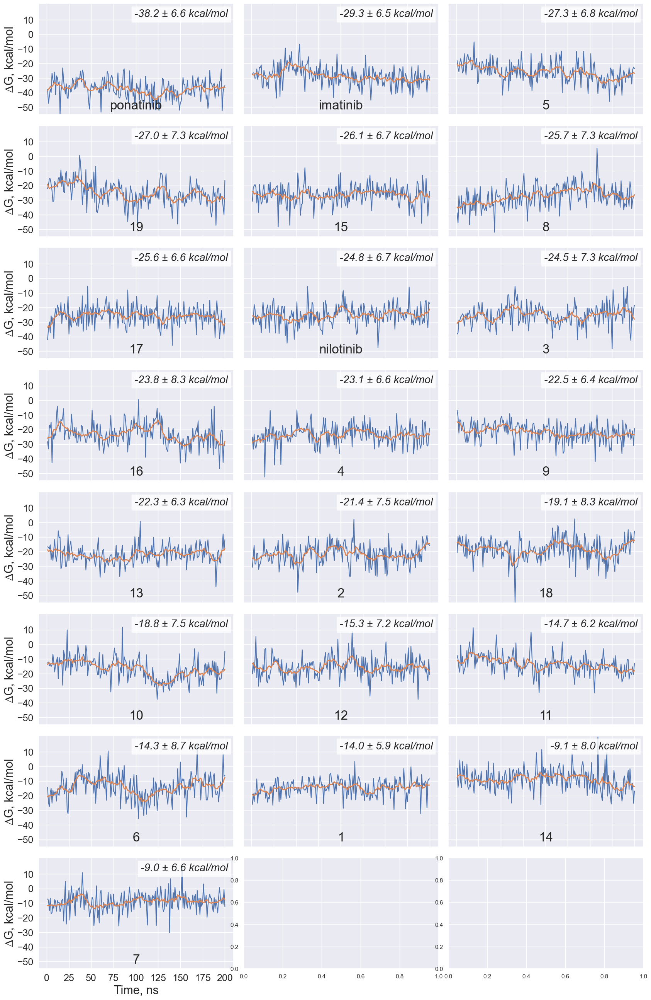

In [9]:
column = 'Energy' # Energy, Entropy, Enthalpy
n_cols = 3
n_rows = 8

show_without_smoothing = True

yticks = [10, 0, -10, -20, -30, -40, -50, -60, -70]
xticks = [0, 25, 50, 75, 100, 125, 150, 175, 200]

#####

if RU:
    lang = "RU"
    time_label = 'Время, нс'
    energy_units = 'ккал/моль'
else:
    lang = "EN"
    time_label = 'Time, ns'
    energy_units = 'kcal/mol'

if column == 'Entropy' or column == 'Energy':
    time_arr = entropy_time
    window_size = 11           #windows_size entropy
else:
    time_arr = enthalpy_time
    window_size = 101          #windows_size enthalpy

if show_without_smoothing:
    ligands_energy = df_energy[column].values
else:
    ligands_energy = [mean_window(i, window_size=window_size) for i in df_energy[column].values]

energy_max = ligands_energy[0].max()
energy_min = ligands_energy[0].min()

for i in ligands_energy:
    if i.max() > energy_max:
        energy_max = i.max()
    if i.min() < energy_min:
        energy_min = i.min()    
        
print(f"Max energy: {energy_max:0.1f}\t Min energy: {energy_min:0.1f}")   

fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(5*n_cols + 2, 3*n_rows + 2),  gridspec_kw=dict(width_ratios=n_cols*[1]))

i, j = 0, 0
for ligand_name, energy, mean_std in df_energy[['Name', column, column + '_mean_std']].values:
    # make skip
    # if (i==0 and j==1) or (i==0 and j==2):
    #     axs[i, j].set_yticklabels([])
    #     axs[i, j].set_xticklabels([])
    #     axs[i, j].set_facecolor('white')
    #     j += 1
    #     if j % n_cols == 0:
    #         j = 0
    #         i += 1
    if show_without_smoothing:
        axs[i, j].plot(time_arr, energy)
    axs[i, j].plot(time_arr, mean_window(energy, window_size=window_size), linewidth=2)

    axs[i, j].set_title(ligand_name, fontdict={'fontsize': 24}, loc="center", y=0.02)
    
    axs[i, j].set_yticks(yticks)
    if j!=0:
        axs[i, j].set_yticklabels([])
    else:
        axs[i, j].set_ylabel('∆G, ' + energy_units, fontsize=22)
        
    axs[i, j].set_xticks(xticks)
    if i!=n_rows-1:
        axs[i, j].set_xticklabels([])
    else:
        axs[i, j].set_xlabel(time_label, fontsize=22)
        
    axs[i, j].set_ylim([math.floor(energy_min), math.ceil(energy_max)])
    axs[i, j].tick_params(axis='both', which='major', labelsize=18)
    axs[i, j].text(0.97, 0.95, f'{mean_std[0]:.1f} ± {mean_std[1]:.1f} ' + energy_units, style='italic', bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 5}, fontsize=20, horizontalalignment="right", verticalalignment='top', transform=axs[i, j].transAxes)
    
    j += 1
    if j % n_cols == 0:
        j = 0
        i += 1

# skip at the end
#axs[n_rows-1, n_cols-1].set_yticklabels([])
#axs[n_rows-1, n_cols-1].set_xticklabels([])
#axs[n_rows-1, n_cols-1].set_facecolor('white')        

fig.tight_layout(pad=1)
plt.subplots_adjust(wspace=0.05, hspace=0.1)
plt.savefig(save_dir + '/' + column + '_plots_' + lang + '.png', dpi=300)
plt.show()

## Energy bar

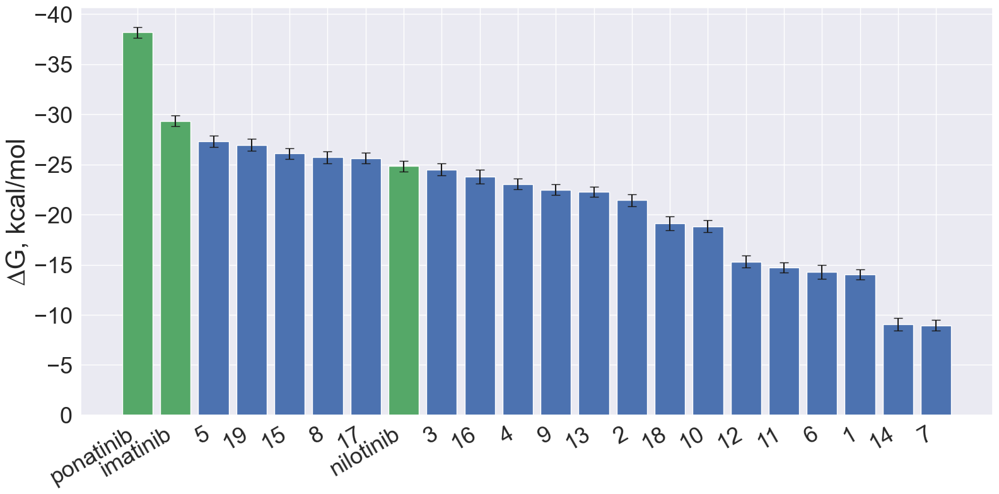

In [10]:
column = 'Energy' # Enthalpy, Entropy, Energy

custom_controls_colors = True

controls = ["ponatinib", "imatinib", "nilotinib"]

#####

if custom_controls_colors:
    base_colors = ["b", "g", "c", "m", "y"]

    colors = ["g" if name in controls else "b" for name in df_energy['Name'].values]
else:
    colors = "b"

if RU:
    lang = "RU"
    title = "Лиганды"
    energy_units = "ккал/моль"
else:
    lang = "EN"
    title = 'Compounds'
    energy_units = "kcal/mol"

averages = df_energy[column + '_mean_std'].apply(lambda x: x[0])

if column == "Enthalpy":
    sme = df_energy[column + '_mean_std'].apply(lambda x: x[1]) / np.sqrt(enthalpy_time.shape[0] - enthalpy_threshold_frame)
else:
    sme = df_energy[column + '_mean_std'].apply(lambda x: x[1]) / np.sqrt(entropy_time.shape[0] - energy_threshold_frame)
    

plt.figure(figsize=(16, 8))
plt.bar(x=df_energy['Name'], height=averages, yerr=sme, capsize=5, color=colors)
plt.gca().invert_yaxis()
#plt.xticks(fontsize=26)
plt.xticks(fontsize=26, rotation=30, ha="right")
plt.yticks(fontsize=26)
plt.ylabel('∆G, ' + energy_units, fontsize=30)
#plt.xlabel(title, fontsize=29)

plt.tight_layout()
plt.savefig(save_dir + "/" + column + '_top_' + lang +  '.png', dpi=300)

## Energy table for report

In [11]:
df_energy_copy = df_energy.copy(deep=True)

df_energy_copy['Enthalpy_mean'] = df_energy_copy["Enthalpy"].apply(lambda x: x[enthalpy_threshold_frame::entropy_step].mean())
df_energy_copy['Enthalpy_std'] = df_energy_copy["Enthalpy"].apply(lambda x: x[enthalpy_threshold_frame::entropy_step].std(ddof=1))
df_energy_copy['Entropy_mean'] = df_energy_copy["Entropy_mean_std"].apply(lambda x: x[0])
df_energy_copy['Entropy_std'] = df_energy_copy["Entropy_mean_std"].apply(lambda x: x[1])
df_energy_copy['Energy_mean'] = df_energy_copy["Energy_mean_std"].apply(lambda x: x[0])
df_energy_copy['Energy_std'] = df_energy_copy["Energy_mean_std"].apply(lambda x: x[1])
df_energy_copy[["Name", "Enthalpy_mean", 'Enthalpy_std', "Entropy_mean", 'Entropy_std', "Energy_mean", "Energy_std"]].round(1).to_excel(save_dir + "\energy_table.xlsx", index=False)
df_energy_copy[["Name", "Enthalpy_mean", 'Enthalpy_std', "Entropy_mean", 'Entropy_std', "Energy_mean", "Energy_std"]].round(1)

,Name,Enthalpy_mean,Enthalpy_std,Entropy_mean,Entropy_std,Energy_mean,Energy_std
0,ponatinib,-64.5,3.8,-26.3,5.9,-38.2,6.6
1,imatinib,-57.2,4.2,-27.8,5.8,-29.3,6.5
2,5,-54.3,3.3,-26.9,6.0,-27.3,6.8
3,19,-53.1,3.3,-26.1,6.4,-27.0,7.3
4,15,-52.7,2.9,-26.6,6.0,-26.1,6.7
5,8,-51.6,4.3,-25.9,6.1,-25.7,7.3
6,17,-53.1,3.0,-27.5,6.1,-25.6,6.6
7,nilotinib,-55.2,3.3,-30.3,5.3,-24.8,6.7
8,3,-48.9,4.7,-24.4,5.8,-24.5,7.3
9,16,-53.0,5.7,-29.2,6.4,-23.8,8.3


# RMSD analysis

## Helper code

In [12]:
def rmsd_dat_to_csv(dat_file):
    dat_content = open(dat_file).readlines()
    csv_content_list = [','.join(i.strip().split()) for i in dat_content]
    csv_content = '\n'.join(csv_content_list).strip()
    
    return StringIO(csv_content)

### Read order for data

In [13]:
rmsd_file_csv = save_dir + os.sep + "energy_top_order.csv"

#####

df_order = pd.read_csv(rmsd_file_csv, dtype={'Name' : str, 'New name' : str})

#### Add protein apo-form (optional)

In [14]:
df_apo = pd.DataFrame({'Name': ['apo'], 'New name': ['Abl1 kinase']})

#####

df_order = pd.concat([df_apo, df_order], ignore_index = True)

## RMSD

In [15]:
rmsd_backbone_dir = work_dir + os.sep + 'rmsd_backbone_begin'
rmsd_start, rmsd_end, rmsd_step = 2, 4000, 2

#####

rmsd_time = np.arange(rmsd_start, rmsd_end+1, rmsd_step) / frames_per_ns

pd_rmsd_dict = {'Name' : [], 'rmsd' : []}

for dat_file in glob.glob(rmsd_backbone_dir + os.sep + '*.dat'):
    pd_rmsd_dict['Name'].append(os.path.basename(dat_file)[:-4])
    pd_rmsd_dict['rmsd'].append(pd.read_csv(rmsd_dat_to_csv(dat_file), names=['frame', 'rmsd'], header=0)['rmsd'].values)
    
df_rmsd = pd.DataFrame(pd_rmsd_dict)
df_rmsd['rmsd_mean_std'] = df_rmsd['rmsd'].apply(lambda x: (x.mean(), x.std()))
print(f"RMSD data quantity: {df_rmsd.shape[0]}")
df_rmsd.head()

RMSD data quantity: 23


,Name,rmsd,rmsd_mean_std
0,1,"[2.0051, 2.0393, 2.1486, 2.4531, 2.6895, 2.269...","(2.60701875, 0.4100176200645986)"
1,10,"[1.489, 1.2893, 1.3561, 1.5074, 1.4484, 1.4733...","(3.1734899, 0.48897477109559545)"
2,11,"[1.9444, 2.1376, 1.9968, 1.901, 1.6805, 2.0795...","(2.5742223, 0.5123788332403183)"
3,12,"[1.955, 2.0182, 1.9747, 1.8192, 1.9817, 2.0428...","(3.6849647, 0.7478502943463418)"
4,13,"[1.4932, 1.563, 1.8881, 1.7914, 1.9503, 2.1248...","(3.0161857, 0.42180022385663807)"


### Set order for data

In [16]:
df_rmsd = pd.merge(df_order, df_rmsd, on='Name', how='left').drop(columns="Name").rename(columns={"New name" : "Name"})

### Draw plots

Enter the appropriate number of rows and columns for your data

Max RMSD: 6.0


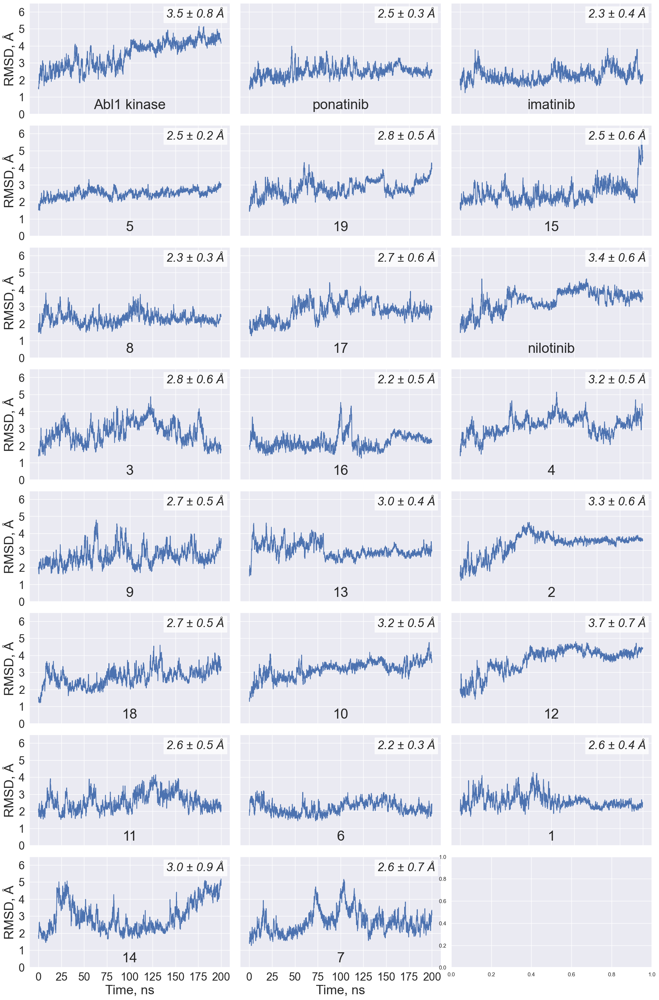

In [17]:
n_rows = 8
n_cols = 3
rmsd_max = 6

yticks = [0, 1, 2, 3, 4, 5, 6]
xticks = [0, 25, 50, 75, 100, 125, 150, 175, 200]

#####

if RU:
    lang = "RU"
    title = "Время, нс"
else:
    lang = "EN"
    title = "Time, ns"

rmsd_max = 0
ligands_rmsd = df_rmsd['rmsd'].values

for i in ligands_rmsd:
    if i.max() > rmsd_max:
        rmsd_max = i.max()
        
print(f"Max RMSD: {rmsd_max:0.1f}")

fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(5.5*n_cols + 2, 3*n_rows + 4),  gridspec_kw=dict(width_ratios=[1]*n_cols))

i, j = 0, 0
for complex_name, rmsd, mean_std in df_rmsd[['Name', 'rmsd', 'rmsd_mean_std']].values:
    # make skip
    # if (i==0 and j==1) or (i==0 and j==2):
    #     axs[i, j].set_yticklabels([])
    #     axs[i, j].set_xticklabels([])
    #     axs[i, j].set_facecolor('white')
    #     j += 1
    #     if j % n_cols == 0:
    #         j = 0
    #         i += 1
    axs[i, j].plot(rmsd_time, rmsd)
    axs[i, j].set_title(complex_name, fontdict={'fontsize': 28}, loc="center", y=0.02)
        
    axs[i, j].set_yticks(yticks)
    
    if j == 0:
        axs[i, j].set_ylabel('RMSD, Å', fontsize=26)
    else:
        axs[i, j].set_yticklabels([])
        
    axs[i, j].set_xticks(xticks)
    
    if i == n_rows-1:
        axs[i, j].set_xlabel(title, fontsize=26)
    else:
        axs[i, j].set_xticklabels([])
        
    axs[i, j].set_ylim([0-0.01, rmsd_max + 0.5])
    axs[i, j].tick_params(axis='both', which='major', labelsize=22)
    axs[i, j].text(0.97, 0.95, f'{mean_std[0]:.1f} ± {mean_std[1]:.1f} Å', style='italic', bbox={'facecolor': 'white', 'alpha': 0.8, 'pad': 5}, fontsize=24, horizontalalignment="right", verticalalignment='top', transform=axs[i, j].transAxes)
    
    j += 1
    if j % n_cols == 0:
        j = 0
        i += 1

# skip at the end
# axs[n_rows-1, n_cols-1].set_yticklabels([])
# axs[n_rows-1, n_cols-1].set_xticklabels([])
# axs[n_rows-1, n_cols-1].set_facecolor('white')

fig.tight_layout(pad=1)
plt.subplots_adjust(wspace=0.05, hspace=0.1)
plt.savefig(save_dir + os.sep + 'rmsd_' + lang + '.png', dpi=300)
plt.show()

## RMS2D ANALYSIS

In [18]:
rms2d_dir = work_dir + os.sep + 'rmsd2_backbone'

pd_rms2d_dict = {'Name' : [], 'rms2d' : []}

for dat_file in glob.glob(rms2d_dir + os.sep + '*.dat'):
    pd_rms2d_dict['Name'].append(os.path.basename(dat_file)[:-4])
    pd_rms2d_dict['rms2d'].append(pd.read_csv(rmsd_dat_to_csv(dat_file)).drop(columns='#Frame').to_numpy())
    
df_rms2d = pd.DataFrame(pd_rms2d_dict)
df_rms2d['rms2d_mean_std'] = df_rms2d['rms2d'].apply(lambda x: (np.mean(x), np.std(x)))
print(f"RMS2D data quantity: {df_rms2d.shape[0]}")
df_rms2d.head()

RMS2D data quantity: 23


,Name,rms2d,rms2d_mean_std
0,1,"[[0.0, 1.644, 1.824, 1.598, 1.557, 2.062, 1.82...","(2.6256100320000004, 0.6964662823518156)"
1,10,"[[0.0, 1.202, 1.244, 1.33, 1.407, 1.677, 1.44,...","(2.8827499120000004, 0.8232195259248849)"
2,11,"[[0.0, 1.756, 1.474, 2.342, 1.872, 1.846, 1.77...","(2.2992639839999995, 0.5417266819425158)"
3,12,"[[0.0, 1.417, 2.242, 1.647, 1.465, 1.462, 1.46...","(2.681246896, 0.9218095291948143)"
4,13,"[[0.0, 1.454, 1.277, 1.522, 1.418, 1.958, 2.18...","(2.869908104, 0.7632746961632655)"


#### Set order

In [19]:
df_rms2d = pd.merge(df_order, df_rms2d, on='Name', how='left').drop(columns="Name").rename(columns={"New name" : "Name"})

### Draw plots (works slowly)

PLEASE ENTER A SUITABLE NUMBER OF COLUMNS AND ROWS 

Max RMS2D: 6.7


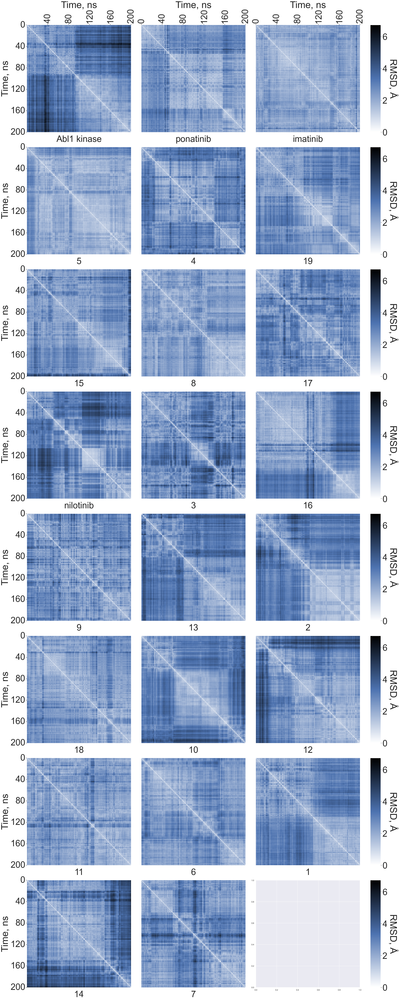

In [20]:
n_row = 8
n_col = 3
max_rms2d = 6

frame_rms2d =  [0, 100, 200, 300, 400, 500]
time_ns = [0, 40, 80, 120, 160, 200]

#####

if RU:
    lang = "RU"
    title = "Время, нс"
else:
    lang = "EN"
    title = "Time, ns"

max_rms2d = 0

for i in df_rms2d['rms2d']:
    temp = i.max()
    if temp > max_rms2d:
        max_rms2d = temp

print(f"Max RMS2D: {max_rms2d:0.1f}")

fig, axs = plt.subplots(nrows=n_row, ncols=n_col+1, figsize=(9.5*n_col + 2, 9.5*n_row),  gridspec_kw=dict(width_ratios=[1.0]*n_col + [0.1]))

ticks_size = 48
label_size = 52
title_size = 56

i, j = 0, 0
for complex_name, rms2d, mean_std in df_rms2d[['Name', 'rms2d', 'rms2d_mean_std']].values:
    # make skip
    # if (i==0 and j==2):
    #     axs[i, j].set_yticklabels([])
    #     axs[i, j].set_xticklabels([])
    #     axs[i, j].set_facecolor('white')
    #     j += 1
    #     if j % n_col == 0:
    #         fig.colorbar(axs[0, 0].collections[0], cax=axs[i, n_col])
    #         axs[i, n_col].tick_params(labelsize=ticks_size) 
    #         axs[i, n_col].set_ylabel('RMSD, Å', fontdict={'fontsize': label_size}, rotation=270) 
    #         axs[i, n_col].get_yaxis().labelpad = label_size + 5
    #         j = 0
    #         i += 1
    axs[i, j].xaxis.tick_top()
    axs[i, j].xaxis.set_label_position('top') 
    axs[i, j].yaxis.tick_left()
    
    sns.heatmap(rms2d, ax=axs[i, j], cbar=False, yticklabels=True, xticklabels=True, vmax=max_rms2d,
                cmap=sns.blend_palette(["#ffffff", "#4c72b0", sns.set_hls_values("#4c72b0", l=0.0)], as_cmap=True))
    axs[i, j].set_title(complex_name, fontdict={'fontsize': title_size - 8}, y=-0.10)
    
    if i == 0:
        if j == 0:
            shift = 1
        else:
            shift = 0
        axs[i, j].set_xticks(frame_rms2d[shift:])
        axs[i, j].set_xticklabels(time_ns[shift:], fontdict={'fontsize': ticks_size})
        axs[i, j].set_xlabel(title, fontdict={'fontsize': label_size})
    else:
        axs[i, j].set_xticks([])
        
    if j == 0:
        axs[i, j].set_yticks(frame_rms2d)
        axs[i, j].set_yticklabels(time_ns, fontdict={'fontsize': ticks_size})
        axs[i, j].set_ylabel(title, fontdict={'fontsize': label_size})
    else:
        axs[i, j].set_yticks([])
        
    j += 1
    if j % n_col == 0:
        fig.colorbar(axs[0, 0].collections[0], cax=axs[i, n_col])
        axs[i, n_col].tick_params(labelsize=ticks_size) 
        axs[i, n_col].set_ylabel('RMSD, Å', fontdict={'fontsize': label_size}, rotation=270) 
        axs[i, n_col].get_yaxis().labelpad = label_size + 5
        j = 0
        i += 1

if j != 0:
    fig.colorbar(axs[0, 0].collections[0], cax=axs[i, n_col])
    axs[i, n_col].tick_params(labelsize=ticks_size)
    axs[i, n_col].set_ylabel('RMSD, Å', fontdict={'fontsize': label_size}, rotation=270)
    axs[i, n_col].get_yaxis().labelpad = label_size + 5

fig.tight_layout(pad=1.0)
plt.savefig(save_dir + os.sep + "rms2d_vertical_" + lang + ".png", dpi=150)
plt.show()

### RMS2D mean values

In [21]:
max_name_len = df_rms2d['Name'].apply(len).max()

for complex_name, mean_std in df_rms2d[['Name', 'rms2d_mean_std']].values:
    print(f"{complex_name}:{(max_name_len - len(complex_name)) * ' '} mean {mean_std[0]:.1f}\tstd {mean_std[1]:.1f}")    

Abl1 kinase: mean 3.1	std 1.0
ponatinib:   mean 2.4	std 0.6
imatinib:    mean 2.1	std 0.4
5:           mean 2.0	std 0.5
4:           mean 2.7	std 0.7
19:          mean 2.5	std 0.6
15:          mean 2.5	std 0.7
8:           mean 2.2	std 0.5
17:          mean 2.7	std 0.6
nilotinib:   mean 3.0	std 0.9
3:           mean 2.9	std 0.7
16:          mean 2.5	std 0.8
9:           mean 2.5	std 0.6
13:          mean 2.9	std 0.8
2:           mean 2.7	std 0.8
18:          mean 2.3	std 0.5
10:          mean 2.9	std 0.8
12:          mean 2.7	std 0.9
11:          mean 2.3	std 0.5
6:           mean 2.4	std 0.5
1:           mean 2.6	std 0.7
14:          mean 2.9	std 1.0
7:           mean 2.6	std 0.7


# Decomposition analysis

##### Helper Functions

In [4]:
def get_decomposition_csv(dat_file):
    decomposition_lines = open(dat_file, 'r').readlines()

    try:
        decomposition_index = decomposition_lines.index(',,Avg.,Std. Dev.,Std. Err. of Mean,Avg.,Std. Dev.,Std. Err. of Mean,Avg.,Std. Dev.,Std. Err. of Mean,Avg.,Std. Dev.,Std. Err. of Mean,Avg.,Std. Dev.,Std. Err. of Mean\n')
    except:
        print(os.path.basename(dat_file), ": DECOMPOSITION NOT FOUND")
        return

    headers = 'residue,location,internal_mean,internal_std,internal_sem,vdw_mean,vdw_std,vdw_sem,electrostatic_mean,electrostatic_std,electrostatic_sem,polar_solv_mean,polar_solv_std,polar_solv_sem,nonpolar_solv_mean,nonpolar_solv_std,nonpolar_solv_sem,total_mean,total_std,total_sem\n'
    decomposition_string = headers  + ''.join(decomposition_lines[decomposition_index+1:]).strip()

    return StringIO(decomposition_string)

## Read decomposition data

In [5]:
file_decomp_csv = save_dir + os.sep + "energy_top_order.csv"

decomp_dir = work_dir + os.sep + 'decomposition'
significant_energy_treshhold = -1.5
energy_to_show_treshhold = -1

#####

energy_term = "total" #nonpolar_solv, polar_solv, vdw, electrostatic, total
select_key_residues = True
df_order = pd.read_csv(file_decomp_csv).rename(columns={"Name" : "residue"})
df_order["residue"] = df_order["residue"].astype(str)

if select_key_residues:
    set_resi = set()

    for decomp_file in glob.glob(decomp_dir + os.sep + '*.dat'):
        if os.path.basename(decomp_file)[:-4] in df_order['residue'].values:
            df_decomp = pd.read_csv(get_decomposition_csv(decomp_file))
            set_resi.update(set(df_decomp[(df_decomp["location"].str.startswith("R ")) & (df_decomp[energy_term + "_mean"] <= significant_energy_treshhold)]["residue"].values))

    list_resi = list(set_resi)
    list_resi.sort(key = lambda x: int(x[3:]))
    list_resi
else:
    df_decomp_temp = pd.read_csv(get_decomposition_csv(glob.glob(decomp_dir + os.sep + '*.dat')[0]))
    df_decomp_temp["show_chain"] = df_decomp_temp["residue"].apply(lambda x: chain_names[get_chain(int(x[3:]))-1] in chains_to_show)
    list_resi = df_decomp_temp[(df_decomp_temp["location"].str.startswith("R ")) & (df_decomp_temp["show_chain"])]["residue"].values


pd_decomp_dict = {'residue' : list_resi}
df_decomp_total = pd.DataFrame(pd_decomp_dict)
df_decomp_report = pd.DataFrame(pd_decomp_dict)

for decomp_file in glob.glob(decomp_dir + os.sep + '*.dat'):
    lig_name = os.path.basename(decomp_file)[:-4]
    if lig_name in df_order['residue'].values:
        df_decomp = pd.read_csv(get_decomposition_csv(decomp_file))
        df_decomp = df_decomp[(df_decomp["residue"].isin(list_resi))]
        df_decomp['mean_std'] = df_decomp[[energy_term + "_mean", energy_term + "_std"]].apply(lambda x: (x[0], x[1]), axis=1)
        df_decomp = df_decomp[["residue", 'mean_std']].rename(columns={'mean_std' : lig_name})
        df_decomp_total = pd.merge(df_decomp_total, df_decomp, on="residue")

df_decomp_total = df_decomp_total.set_index('residue')
df_decomp_total = df_decomp_total.T
df_decomp_total = pd.merge(df_order.set_index('residue'), df_decomp_total, left_index=True, right_index=True)
df_decomp_total = df_decomp_total.set_index('New name')
df_decomp_total.index.name = None

df_decomp_total = df_decomp_total.rename(columns={column : rename_residue(column, chain=False) for column in df_decomp_total.columns})
df_decomp_total = df_decomp_total.T

print(f"Decomposition data quantity: {df_decomp_total.shape[0]}")

df_decomp_report = df_decomp_total.applymap(lambda x: str(round(x[0], 1)) + " ± " + str(round(x[1], 1)) if x[0] <= energy_to_show_treshhold else "-")
df_decomp_mean = df_decomp_total.applymap(lambda x: x[0])

Decomposition data quantity: 21


## Show report table

In [6]:
df_decomp_report

,ponatinib,imatinib,5,19,15,8,17,nilotinib,3,16,...,13,2,18,10,12,11,6,1,14,7
LEU 248,-,-1.2 ± 0.3,-1.3 ± 0.4,-1.1 ± 0.3,-1.3 ± 0.4,-1.8 ± 0.4,-1.2 ± 0.4,-1.4 ± 0.5,-,-,...,-1.8 ± 0.5,-,-1.4 ± 0.4,-,-,-,-,-,-,-
VAL 256,-1.2 ± 0.3,-,-1.0 ± 0.3,-1.4 ± 0.3,-1.0 ± 0.3,-1.1 ± 0.2,-1.2 ± 0.4,-1.3 ± 0.3,-1.1 ± 0.3,-1.2 ± 0.3,...,-1.6 ± 0.5,-1.0 ± 0.2,-1.3 ± 0.3,-,-,-,-,-,-,-
ALA 269,-1.3 ± 0.3,-1.5 ± 0.2,-1.6 ± 0.2,-1.1 ± 0.2,-1.5 ± 0.2,-1.1 ± 0.2,-1.5 ± 0.2,-1.4 ± 0.3,-1.3 ± 0.3,-1.0 ± 0.2,...,-1.8 ± 0.4,-1.2 ± 0.3,-1.2 ± 0.2,-,-,-,-,-,-,-
LYS 271,-,-1.6 ± 0.6,-1.2 ± 0.4,-2.6 ± 0.9,-1.3 ± 0.4,-,-1.1 ± 0.4,-1.2 ± 0.4,-1.1 ± 0.6,-2.7 ± 0.9,...,-1.2 ± 1.2,-,-,-1.6 ± 0.9,-1.8 ± 0.8,-2.7 ± 0.8,-1.2 ± 0.4,-1.7 ± 0.8,-1.3 ± 0.5,-2.5 ± 0.9
LYS 285,-,-,-,-,-,-,-,-,-,-,...,-,-,-,-,-,-,-,-1.5 ± 0.7,-,-
GLU 286,-,-,-,-,-,-,-,-,-,-,...,-,-,-,-1.9 ± 1.2,-,-,-,-1.0 ± 1.1,-,-
VAL 289,-1.3 ± 0.3,-1.1 ± 0.3,-,-1.0 ± 0.3,-1.6 ± 0.3,-1.4 ± 0.5,-1.7 ± 0.4,-1.4 ± 0.4,-1.3 ± 0.5,-1.3 ± 0.4,...,-,-1.5 ± 0.4,-,-2.0 ± 0.4,-2.2 ± 0.4,-1.8 ± 0.4,-1.6 ± 0.5,-1.9 ± 0.4,-2.4 ± 0.5,-1.9 ± 0.3
MET 290,-1.8 ± 0.4,-1.6 ± 0.3,-1.8 ± 0.4,-1.9 ± 0.4,-1.6 ± 0.3,-1.8 ± 0.4,-1.9 ± 0.4,-1.7 ± 0.4,-1.8 ± 0.4,-2.0 ± 0.4,...,-2.1 ± 0.4,-2.0 ± 0.4,-1.4 ± 0.4,-1.8 ± 0.4,-1.7 ± 0.5,-2.0 ± 0.4,-1.8 ± 0.5,-1.8 ± 0.4,-1.5 ± 0.4,-2.0 ± 0.5
LEU 298,-,-,-,-,-,-,-,-,-,-,...,-,-,-1.8 ± 0.5,-,-,-,-,-,-,-
VAL 299,-1.7 ± 0.3,-2.1 ± 0.4,-2.0 ± 0.4,-1.5 ± 0.3,-1.9 ± 0.4,-1.4 ± 0.3,-1.8 ± 0.4,-1.9 ± 0.4,-1.4 ± 0.3,-1.6 ± 0.3,...,-1.5 ± 0.4,-1.5 ± 0.3,-2.1 ± 0.7,-1.1 ± 0.3,-1.7 ± 0.5,-1.3 ± 0.3,-,-1.1 ± 0.3,-1.1 ± 0.4,-1.5 ± 0.5


### Report table to excel

In [7]:
df_decomp_report.to_excel(save_dir + "\decomp_-1.xlsx")

## Draw decompostion heatmap

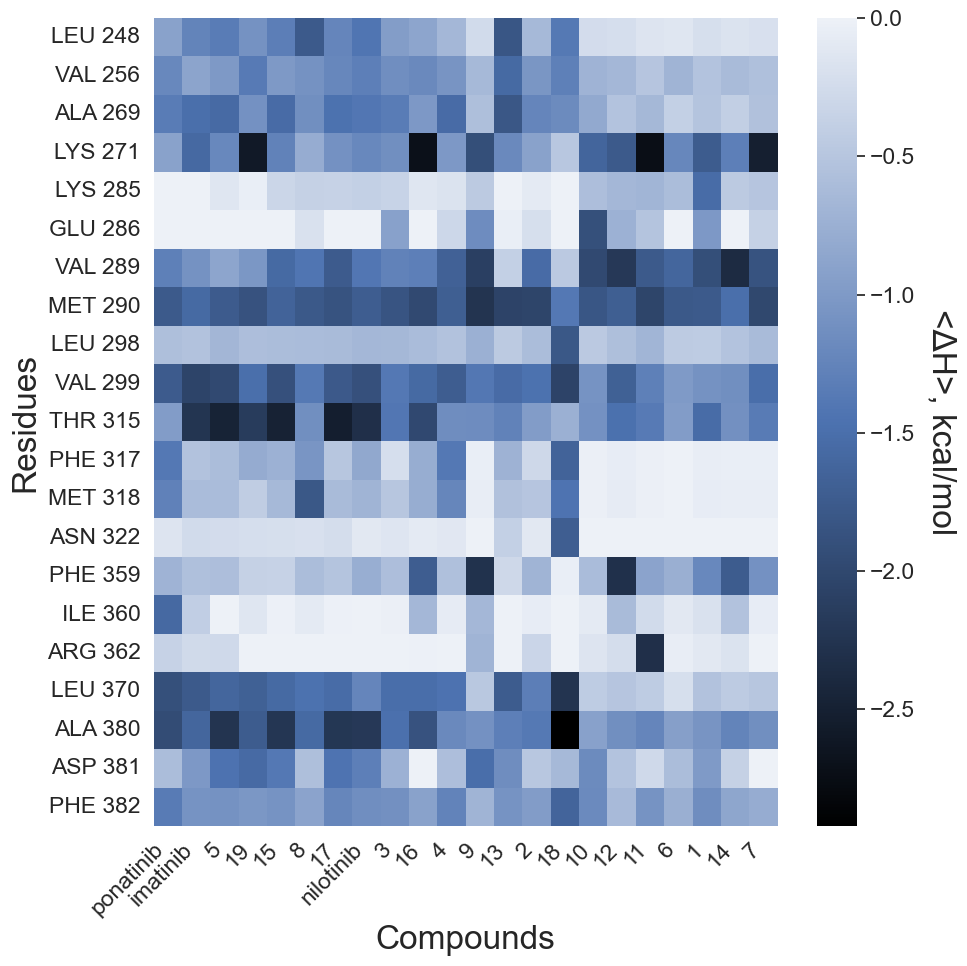

In [12]:
if RU:
    lang = "RU"
    energy_units = "ккал/моль"
    resi_title = "Остатки"
    compouns_title = "Лиганды"
else:
    lang = "EN"
    energy_units = "kcal/mol"
    resi_title = "Residues"
    compouns_title = "Compounds"

sns.set(font_scale=1.5)
fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))

sns.heatmap(df_decomp_mean, ax=axs, xticklabels=True, vmax=0,
            cmap=sns.blend_palette([sns.set_hls_values("#4c72b0", l=0.0), "#4c72b0", sns.set_hls_values("#4c72b0", l=0.95)], as_cmap=True))
axs.collections[0].colorbar.set_label('<ΔH>, ' + energy_units, fontdict={'fontsize': 24}, rotation=270, labelpad = 30) 
axs.set_xlabel(compouns_title, fontdict={'fontsize': 24})
axs.set_xticklabels(axs.get_xticklabels(), rotation=45, ha="right")
axs.set_ylabel(resi_title, fontdict={'fontsize': 24})
plt.tight_layout()
plt.savefig(save_dir + '/decomposition_' + lang + '.png', dpi=300)
plt.show()

## Check key residues

### Print key residues sorted by energy sum

In [27]:
print(df_decomp_mean.sum(axis=1).sort_values().apply(lambda x: str(round(x, 1))))

MET 290    -39.9
ALA 380    -34.7
VAL 299    -34.1
THR 315    -33.9
LYS 271    -32.9
VAL 289    -32.9
LEU 370    -26.1
ALA 269    -23.6
PHE 382    -23.0
VAL 256    -21.4
PHE 359    -19.3
LEU 248    -18.3
ASP 381    -17.3
LEU 298    -14.1
MET 318    -12.1
PHE 317    -11.8
LYS 285     -7.7
ILE 360     -5.6
ARG 362     -4.9
ASN 322     -4.2
GLU 286     -0.5
dtype: object


### Pymol key residues selection command

In [28]:
energy_sum_treshhold = -20

#####

key_residues = df_decomp_mean[df_decomp_mean.sum(axis=1) <= energy_sum_treshhold].index
print("select key_residues, resi", '+'.join([resi.split()[-1] for resi in key_residues]))

select key_residues, resi 256+269+271+289+290+299+315+370+380+382


# RMSF analysis

##### Helper Functions

In [29]:
def rmsf_dat_to_csv(dat_file):
    dat_content = open(dat_file).readlines()
    csv_content_list = [','.join(i.strip().split()) for i in dat_content]
    csv_content = '\n'.join(csv_content_list).strip()
    
    return StringIO(csv_content)

## Get RMSF data

In [30]:
rmsf_backbone_dir = work_dir + os.sep + 'rmsf'  
chain_name = "A"
# Cut terminal residues with high RMSF
cut_resi = 5

#####

chain_num = chain_names.index(chain_name)
first_residue_idx = chains_begin_index[chain_num] - 1
if chain_num + 1 < len(chains_begin_index):
    last_residue_idx = chains_begin_index[chain_num + 1] - 1
else:
    last_residue_idx = None

pd_rmsf_dict = {'Name' : [], 'rmsf' : []}

for dat_file in glob.glob(rmsf_backbone_dir + os.sep + '*.dat'):
    pd_rmsf_dict['Name'].append(os.path.basename(dat_file)[:-4])
    rmsf_data = pd.read_csv(rmsf_dat_to_csv(dat_file), names=['residue', 'rmsf'], header=0)['rmsf'].values
    pd_rmsf_dict['rmsf'].append(rmsf_data[first_residue_idx:last_residue_idx])
    
df_rmsf = pd.DataFrame(pd_rmsf_dict)

residue_numbers = pd.read_csv(rmsf_dat_to_csv(dat_file), names=['residue', 'rmsf'], header=0)['residue'].values[first_residue_idx:last_residue_idx].astype(int)
residue_numbers = [get_resi_num(r) for r in residue_numbers]
print(f"Residue numbers: {' '.join(str(n) for n in residue_numbers[:4])} ... {' '.join(str(n) for n in residue_numbers[-4:])}")

print(f"RMSF data quantity:", df_rmsf.shape[0])
df_rmsf.head()

Residue numbers: 228 229 230 231 ... 508 509 510 511
RMSF data quantity: 23


,Name,rmsf
0,1,"[8.511, 6.3605, 5.5134, 4.5026, 3.0846, 1.7972..."
1,10,"[5.2168, 4.7573, 4.7368, 4.5682, 2.9405, 1.969..."
2,11,"[10.252, 8.0342, 6.3056, 4.7087, 3.076, 1.8633..."
3,12,"[11.3912, 9.4159, 8.1714, 6.931, 4.8669, 2.894..."
4,13,"[11.6078, 9.2918, 7.4212, 5.4886, 3.8976, 3.01..."


## Set order for data

### Read order

In [31]:
rmsf_order_csv = save_dir + os.sep + "energy_top_order.csv"

#####

df_order = pd.read_csv(rmsf_order_csv, dtype={'Name' : str, 'New name' : str})

### Add protein apo-form (optional)

In [32]:
df_apo = pd.DataFrame({'Name': ['apo'], 'New name': ['Abl1 kinase']})

#####

df_order = pd.concat([df_apo, df_order], ignore_index = True)

### Set order

In [33]:
df_rmsf = pd.merge(df_order, df_rmsf, on="Name").drop(columns="Name").rename(columns={"New name" : "Name"})

## Draw RMSF
Attention, the number of colors is limited and will be repeated if the number of data is more than 9

Max RMSF: 15.5


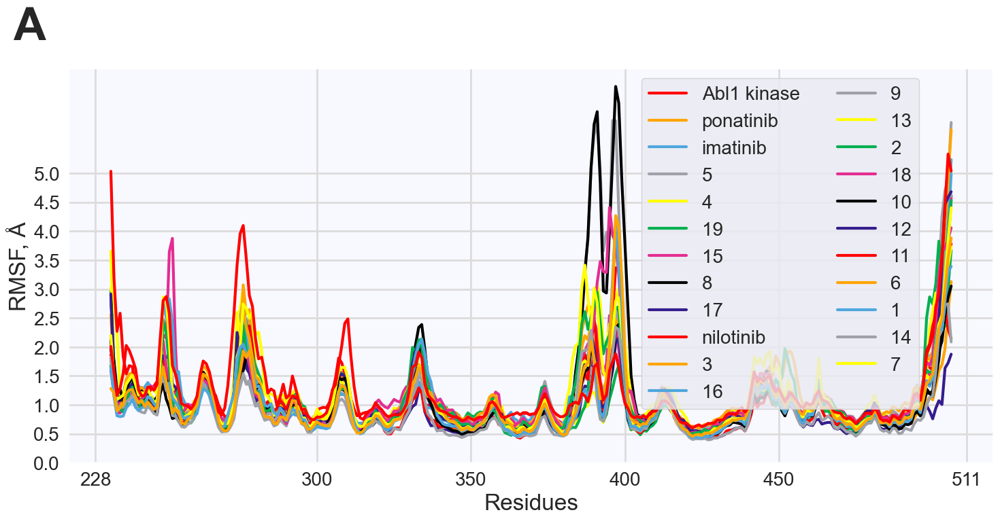

In [34]:
rmsf_ticks = [0, 0.5, 1, 1.5, 2, 2.5, 3.0, 3.5, 4.0, 4.5, 5.0]
residue_ticks = [228, 300, 350, 400, 450, 511]
colors = ['#ff0000', 'orange', '#4ea6dc', '#9fa1a8', '#ffff00', '#00b050', '#e32d91', 'black', '#351d8c']
title = "A"

#####

rmsf_max = 0
for i in df_rmsf['rmsf'].values:
    if i[cut_resi:-cut_resi].max() > rmsf_max:
        rmsf_max = i[cut_resi:-cut_resi].max()
        
print(f"Max RMSF: {rmsf_max:0.1f}")

if RU:
    lang = "RU"
    x_label = 'Остатки'
else:
    lang = "EN"
    x_label = 'Residues'

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 8))

i = 0
for complex_name, rmsf in reversed(df_rmsf[['Name', 'rmsf']].values):
    ax.set_facecolor('ghostwhite')
    ax.grid(color='gainsboro', linewidth=2)
    color = colors[(df_rmsf.shape[0] - i - 1) % len(colors)]
    ax.plot(residue_numbers[cut_resi:-cut_resi], rmsf[cut_resi:-cut_resi], label=complex_name, linewidth=3, color=color, alpha=1)
    i += 1

ax.set_ylabel('RMSF, Å', fontsize=24)
ax.set_xlabel(x_label, fontsize=24)
ax.set_yticks(rmsf_ticks)
ax.set_xticks(residue_ticks)
ax.tick_params(axis='both', which='major', labelsize=20)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], fontsize=20, loc='upper right', bbox_to_anchor=(0.93, 1.0), ncol=2)

plt.title(title, fontdict={'fontsize': 48, 'fontweight':'bold'}, loc='left', x=-0.06, y=1.06)
fig.tight_layout(pad=1)
fig.savefig(save_dir + os.sep + 'rmsf_' + lang + '.png', dpi=300)
plt.show()

## RMSF mean values

In [35]:
max_name_len = df_rmsf['Name'].apply(len).max()

for complex_name, rmsf in df_rmsf[['Name', 'rmsf']].values:
    print(f"{complex_name}:{(max_name_len - len(complex_name)) * ' '} mean {rmsf.mean():.2f}")

Abl1 kinase: mean 1.44
ponatinib:   mean 1.12
imatinib:    mean 1.11
5:           mean 0.97
4:           mean 1.32
19:          mean 1.22
15:          mean 1.31
8:           mean 1.11
17:          mean 1.29
nilotinib:   mean 1.24
3:           mean 1.40
16:          mean 1.28
9:           mean 1.22
13:          mean 1.41
2:           mean 1.23
18:          mean 1.23
10:          mean 1.39
12:          mean 1.06
11:          mean 1.19
6:           mean 1.26
1:           mean 1.25
14:          mean 1.44
7:           mean 1.31


## Get RMSF for decomposition "Hot Spots"

In [36]:
hotspots_xlsx_file = save_dir + os.sep + "decomp_-1.xlsx"

#####

residue_list = pd.read_excel(hotspots_xlsx_file)["Unnamed: 0"].values

df_rmsf_hotspots = df_rmsf.copy(deep=True)
for residue in residue_list:
    residue_number = int(residue.split(" ")[1])
    residue_idx = residue_numbers.index(residue_number)
    df_rmsf_hotspots[residue] = df_rmsf_hotspots["rmsf"].apply(lambda x: x[residue_idx])

df_rmsf_hotspots = df_rmsf_hotspots.drop(columns="rmsf").rename(columns={"Name" : "Residue"}).set_index("Residue").T.round(1)
df_rmsf_hotspots

Residue,Abl1 kinase,ponatinib,imatinib,5,4,19,15,8,17,nilotinib,...,13,2,18,10,12,11,6,1,14,7
LEU 248,1.4,1.0,1.0,0.8,1.1,1.0,1.3,0.8,1.0,1.4,...,1.2,1.0,1.3,1.1,1.0,1.0,1.1,1.1,1.1,1.1
VAL 256,1.0,0.7,0.8,0.6,0.8,0.9,0.9,0.7,0.8,0.8,...,1.0,0.7,1.0,0.8,0.7,0.7,0.8,0.8,0.7,0.9
ALA 269,0.8,0.6,0.6,0.5,0.7,0.6,0.8,0.6,0.7,0.9,...,0.7,0.6,0.7,0.6,0.6,0.6,0.6,0.7,0.7,0.7
LYS 271,1.3,0.6,0.8,0.5,0.7,0.6,0.8,0.6,0.7,0.8,...,0.8,0.6,0.7,0.7,0.7,0.6,0.7,0.8,0.6,0.7
LYS 285,1.3,0.8,1.0,0.8,1.1,0.9,0.9,0.9,0.9,1.0,...,1.2,1.0,1.0,1.0,0.9,1.0,1.0,0.9,1.0,1.0
GLU 286,1.2,0.7,0.9,0.7,0.8,0.8,0.7,0.8,0.8,0.9,...,1.2,0.8,0.9,0.8,0.8,0.8,0.9,0.9,0.8,0.8
VAL 289,1.4,0.8,0.9,0.9,0.9,0.9,0.8,0.8,0.9,1.0,...,1.2,1.0,1.0,0.9,0.9,0.9,1.1,1.0,1.0,1.0
MET 290,1.1,0.7,0.7,0.8,0.8,0.7,0.7,0.7,0.8,0.9,...,1.0,0.9,0.8,0.7,0.8,0.8,0.9,0.9,0.8,0.8
LEU 298,0.7,0.6,0.6,0.5,0.6,0.6,0.6,0.5,0.6,0.7,...,0.7,0.7,0.7,0.6,0.6,0.6,0.6,0.7,0.7,0.7
VAL 299,0.7,0.6,0.6,0.6,0.7,0.6,0.6,0.6,0.6,0.7,...,0.8,0.7,0.7,0.6,0.7,0.6,0.6,0.7,0.8,0.8


### Save data

In [37]:
save_xlsx_file = save_dir + os.sep + "rmsf.xlsx"

df_rmsf_hotspots.to_excel(save_xlsx_file)

# Hydrogen bonds analysis

## Hydrogen bonds heatmap

##### Helper Functions

In [38]:
def format_protein_acceptor_name(acceptor):
    residue_name, acceptor_name = acceptor.split("@")
    return f"{residue_name}[{acceptor_name}]"

def format_protein_donor_name(donor_hydrogen, donor):
    residue_name, donor_name = donor.split("@")
    donor_hydrogen_name = donor_hydrogen.split("@")[-1]
    return f"{residue_name}[{donor_hydrogen_name}:{donor_name}]"

def get_hbonds(hbond_dir, option, fraction_threshold=0.2):
    if option not in ("lig_acceptor", "lig_donor"):
        raise Exception("Unknown option")

    protein_atoms = set()
    ligand_atoms = set()

    for hbond_file in glob.glob(hbond_dir + os.sep + '*.dat'):
        lig_name = os.path.basename(hbond_file[:-4])
        df_hbond = pd.read_fwf(hbond_file)
        df_hbond = df_hbond[df_hbond["Frac"] >= fraction_threshold]
        if option == "lig_acceptor":
            ligand_atoms.update(df_hbond["#Acceptor"].apply(lambda x: f"{lig_name}[{x.split('@')[-1]}]").values)
            protein_atoms.update(df_hbond[["DonorH", "Donor"]].apply(lambda x: format_protein_donor_name(x[0], x[1]), axis=1).values)
        elif option == "lig_donor":
            protein_atoms.update(df_hbond["#Acceptor"].apply(format_protein_acceptor_name).values)
            ligand_atoms.update(df_hbond[["DonorH", "Donor"]].apply(lambda x: f"{lig_name}[{x[1].split('@')[-1]}:{x[0].split('@')[-1]}]",axis=1).values)

    if not ligand_atoms or not protein_atoms:
        raise Exception("No hydrogen bonds were found")

    protein_atoms = list(protein_atoms)
    protein_atoms.sort(key = lambda x: int(x[4:x.find("[")]))
    pd_hbond_dict = {"Protein atom" : protein_atoms}
    df_hbond_total = pd.DataFrame(pd_hbond_dict)

    for hbond_file in glob.glob(hbond_dir + os.sep + '*.dat'):
        lig_name = os.path.basename(hbond_file[:-4])
        df_hbond = pd.read_fwf(hbond_file)
        if not df_hbond.shape[0]:
            continue
        if option == "lig_acceptor":
            df_hbond["Protein atom"] = df_hbond[["DonorH", "Donor"]].apply(lambda x: format_protein_donor_name(x[0], x[1]), axis=1)
            df_hbond["Ligand atom"] = df_hbond["#Acceptor"].apply(lambda x: f"{lig_name}[{x.split('@')[-1]}]")
        if option == "lig_donor":
            df_hbond["Protein atom"] = df_hbond["#Acceptor"].apply(format_protein_acceptor_name)
            df_hbond["Ligand atom"] = df_hbond[["DonorH", "Donor"]].apply(lambda x: f"{lig_name}[{x[1].split('@')[-1]}:{x[0].split('@')[-1]}]",axis=1)

        df_hbond = df_hbond[(df_hbond["Protein atom"].isin(protein_atoms)) & (df_hbond["Ligand atom"].isin(ligand_atoms))]
        for ligand_atom in list(set(df_hbond["Ligand atom"].values)):
            df_atom_hbonds = df_hbond[df_hbond["Ligand atom"] == ligand_atom][["Protein atom", "Frac"]].rename(columns={"Frac" : ligand_atom})
            df_hbond_total = pd.merge(df_hbond_total, df_atom_hbonds, on="Protein atom", how="left")

    df_hbond_total["Protein atom"] = df_hbond_total["Protein atom"].apply(lambda x: rename_residue(x[:x.find('[')], chain=False) + x[x.find('['):])
    df_hbond_total = df_hbond_total.set_index("Protein atom")
    df_hbond_total = df_hbond_total.fillna(0).T
    df_hbond_total = df_hbond_total.rename_axis(None, axis=1)
    return df_hbond_total

### Get hydrogen bonds data

In [39]:
hbond_acceptors_dir = work_dir + os.sep + "hbond_acceptor"
hbond_donors_dir = work_dir + os.sep + "hbond_donor"
fraction_threshold = 0.4

#####

df_lig_acceptor = get_hbonds(hbond_acceptors_dir, "lig_acceptor", fraction_threshold)
df_lig_donor = get_hbonds(hbond_donors_dir, "lig_donor", fraction_threshold)

### Set order for data

In [40]:
file_order_csv = save_dir + os.sep + "energy_top_order.csv"

#####

df_order = pd.read_csv(file_order_csv, dtype={'Name' : str, 'New name' : str})
df_order = df_order.rename(columns={"Name" : "Ligand name"})

def set_hbond_order(df_hbond, df_order):
    df_hbond["Ligand name"] = df_hbond.index.to_series().apply(lambda x: x.split("[")[0])
    df_hbond["Ligand atom"] = df_hbond.index.to_series().apply(lambda x: x[x.find("["):])
    df_hbond = pd.merge(df_order, df_hbond, on="Ligand name").drop(columns="Ligand name")
    df_hbond["Ligand atom"] = df_hbond[["New name", "Ligand atom"]].apply(lambda x: f"{x[0]}{x[1]}", axis=1)
    df_hbond = df_hbond.drop(columns="New name").set_index("Ligand atom").rename_axis(None, axis=1)
    return df_hbond

df_lig_acceptor = set_hbond_order(df_lig_acceptor, df_order)
df_lig_donor = set_hbond_order(df_lig_donor, df_order)

### Draw hydrogen bonds heatmap

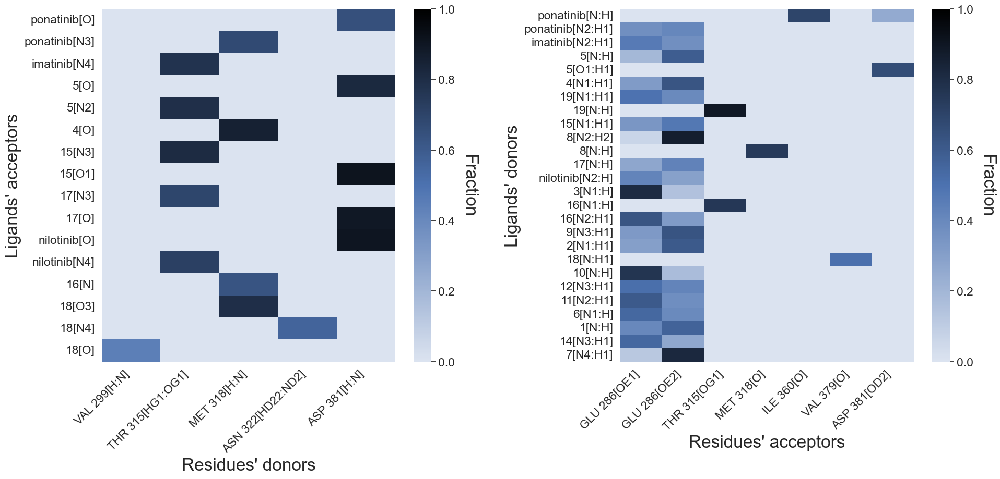

In [41]:
figsize = (20, 10)

#####

if RU:
    lang = "RU"
    acceptor_ytitle = "Акцепторы лигандов"
    acceptor_xtitle = "Доноры остатков"
    donor_ytitle = "Доноры лигандов"
    donor_xtitle = "Акцепторы остатков"
    cbar_title = "Доля фреймов"
else:
    lang = "EN"
    acceptor_ytitle = "Ligands' acceptors"
    acceptor_xtitle = "Residues' donors"
    donor_ytitle = "Ligands' donors"
    donor_xtitle = "Residues' acceptors"
    cbar_title = "Fraction"

sns.set(font_scale=1.5)
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=figsize)

sns.heatmap(df_lig_acceptor, ax=axs[0], yticklabels=True, xticklabels=True, vmax=1, cbar=True,
            cmap=sns.blend_palette([sns.set_hls_values("#4c72b0", l=0.9), "#4c72b0", sns.set_hls_values("#4c72b0", l=0.0)], as_cmap=True))
axs[0].collections[0].colorbar.set_label(cbar_title, fontdict={'fontsize' : 24}, rotation=270, labelpad=30)
axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45, ha="right")
axs[0].set_xlabel(acceptor_xtitle, fontdict={'fontsize': 24})
axs[0].set_ylabel(acceptor_ytitle, fontdict={'fontsize': 24})

sns.heatmap(df_lig_donor, ax=axs[1], yticklabels=True, xticklabels=True, vmax=1, cbar=True,
            cmap=sns.blend_palette([sns.set_hls_values("#4c72b0", l=0.9), "#4c72b0", sns.set_hls_values("#4c72b0", l=0.0)], as_cmap=True))
axs[1].collections[0].colorbar.set_label(cbar_title, fontdict={'fontsize' : 24}, rotation=270, labelpad=30)
axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=45, ha="right")
axs[1].set_xlabel(donor_xtitle, fontdict={'fontsize': 24})
axs[1].set_ylabel(donor_ytitle, fontdict={'fontsize': 24})

fig.tight_layout(pad=2)
fig.savefig(save_dir + '/hbonds_' + lang + '.png', dpi=300)
plt.show()

## Report table

### Read data

In [42]:
lig_acceptor_dir = work_dir + os.sep + "hbond_acceptor"
lig_donor_dir = work_dir + os.sep + "hbond_donor"
fraction_threshold = 0.4
show_chain=False

#####

df_report_acceptor = pd.DataFrame(index=["Ligand acceptor"])

for acceptor_file in glob.glob(lig_acceptor_dir + os.sep + "*.dat"):
    df_acceptor = pd.read_fwf(acceptor_file)
    df_acceptor = df_acceptor[df_acceptor["Frac"] >= fraction_threshold]
    acceptors_list = []
    for acceptor, donor_h, donor, fraction in df_acceptor[["#Acceptor", "DonorH", "Donor", "Frac"]].values:
        residue_name = rename_residue(donor.split("@")[0], chain=show_chain)
        acceptor_atom = acceptor.split("@")[-1]
        donor_h_atom = donor_h.split("@")[-1]
        donor_atom = donor.split("@")[-1]
        acceptors_list.append(f"{acceptor_atom}..{donor_h_atom}:{donor_atom}[{residue_name}; {fraction*100:.0f} %]")
    df_report_acceptor[os.path.basename(acceptor_file).split(".")[-2]] = [acceptors_list]

df_report_donor = pd.DataFrame(index=["Ligand donor"])

for donor_file in glob.glob(lig_donor_dir + os.sep + "*.dat"):
    df_donor = pd.read_fwf(donor_file)
    df_donor = df_donor[df_donor["Frac"] >= fraction_threshold]
    donors_list = []
    for acceptor, donor_h, donor, fraction in df_donor[["#Acceptor", "DonorH", "Donor", "Frac"]].values:
        residue_name = rename_residue(acceptor.split("@")[0], chain=show_chain)
        acceptor_atom = acceptor.split("@")[-1]
        donor_h_atom = donor_h.split("@")[-1]
        donor_atom = donor.split("@")[-1]
        donors_list.append(f"{donor_atom}:{donor_h_atom}..{acceptor_atom}[{residue_name}; {fraction*100:.0f} %]")
    df_report_donor[os.path.basename(donor_file).split(".")[-2]] = [donors_list]

df_hbonds_report = pd.concat([df_report_acceptor, df_report_donor]).T
df_hbonds_report["Hydrogen bonds"] = df_hbonds_report["Ligand acceptor"] + df_hbonds_report["Ligand donor"]
df_hbonds_report["Hydrogen bonds"] = df_hbonds_report["Hydrogen bonds"].apply(lambda x: '\n'.join(x) if x else "-")
df_hbonds_report = df_hbonds_report.drop(columns=["Ligand acceptor", "Ligand donor"])

### Set order for data

In [43]:
file_order_csv = save_dir + os.sep + "energy_top_order.csv"

#####

df_order = pd.read_csv(file_order_csv, dtype={'Name' : str, 'New name' : str}).set_index("Name")
df_hbonds_report = pd.merge(df_order, df_hbonds_report, left_index=True, right_index=True).set_index("New name")
df_hbonds_report.index.name = None

### View data

In [44]:
HTML(df_hbonds_report.to_html().replace("\\n","<br>"))

,Hydrogen bonds
ponatinib,N3..H:N[MET 318; 68 %]O..H:N[ASP 381; 64 %]N:H..O[ILE 360; 70 %]N2:H1..OE2[GLU 286; 41 %]
imatinib,N4..HG1:OG1[THR 315; 78 %]N2:H1..OE1[GLU 286; 46 %]
5,O..H:N[ASP 381; 82 %]N2..HG1:OG1[THR 315; 79 %]O1:H1..OD2[ASP 381; 66 %]N:H..OE2[GLU 286; 59 %]
4,O..H:N[MET 318; 85 %]N1:H1..OE2[GLU 286; 63 %]
19,N:H..OG1[THR 315; 89 %]N1:H1..OE1[GLU 286; 50 %]
15,O1..H:N[ASP 381; 91 %]N3..HG1:OG1[THR 315; 81 %]N1:H1..OE2[GLU 286; 47 %]
8,N2:H2..OE2[GLU 286; 87 %]N:H..O[MET 318; 75 %]
17,O..H:N[ASP 381; 89 %]N3..HG1:OG1[THR 315; 69 %]N:H..OE2[GLU 286; 43 %]
nilotinib,O..H:N[ASP 381; 90 %]N4..HG1:OG1[THR 315; 72 %]N2:H..OE1[GLU 286; 42 %]
3,N1:H..OE1[GLU 286; 81 %]


### Save data

In [45]:
save_file_excel = save_dir + os.sep + "\hbonds_native.xlsx"

#####

df_hbonds_report.to_excel(save_file_excel)